# 1 Dataset
In this project, our primary objective is to execute data preprocessing using **Apache Spark** with `Python`. Given that there is no additional requirement for tasks such as model training or data prediction, our expected outcome is to enhance the suitability of our chosen dataset specifically for machine learning predictions.

We utilized the [Australia Weather Data](https://www.kaggle.com/datasets/arunavakrchakraborty/australia-weather-data/), an open-source dataset available on [**Kaggle**](https://www.kaggle.com/).

As outlined in the *About* section of this dataset, it encompasses approximately 10 years of daily weather observations from numerous locations across Australia. The primary objective of the dataset's creator was to develop a predictive classifier for forecasting next-day rain based on the target variable `RainTomorrow`. The dataset is divided into two subsets: training and testing. To accommodate the anticipated data volume for implementing *Big Data Analytics*, we opted to focus our experimentation on the **Weather Training Data**, which comprises 99,516 instances.

## Column Description (from **Kaggle** Dataset Description)
0. **RowID**: Unique ID of observations.
1. **Location**: Name of the city in Australia.
2. **MinTemp**: Minimum temperature during a specific day (in degrees Celsius).
3. **MaxTemp**: Maximum temperature during a specific day (in degrees Celsius).
4. **Rainfall**: Rainfall during a specific day (in millimeters).
5. **Evaporation**: Evaporation during a specific day (in millimeters).
6. **Sunshine**: Bright sunshine duration during a specific day (in hours).
7. **WindGusDir**: Direction of the strongest gust during a specific day (16 compass points).
8. **WindGuSpeed**: Speed of the strongest gust during a specific day (in kilometers per hour).
9. **WindDir9am**: Wind direction 10 minutes prior to 9 am (compass points).
10. **WindDir3pm**: Wind direction 10 minutes prior to 3 pm (compass points).
11. **WindSpeed9am**: Wind speed 10 minutes prior to 9 am (in kilometers per hour).
12. **WindSpeed3pm**: Wind speed 10 minutes prior to 3 pm (in kilometers per hour).
13. **Humidity9am**: Humidity of the wind at 9 am (in percent).
14. **Humidity3pm**: Humidity of the wind at 3 pm (in percent).
15. **Pressure9am**: Atmospheric pressure at 9 am (in hectopascals).
16. **Pressure3pm**: Atmospheric pressure at 3 pm (in hectopascals).
17. **Cloud9am**: Cloud-obscured portions of the sky at 9 am (in eighths).
18. **Cloud3pm**: Cloud-obscured portions of the sky at 3 pm (in eighths).
19. **Temp9am**: Temperature at 9 am (in degrees Celsius).
20. **Temp3pm**: Temperature at 3 pm (in degrees Celsius).
21. **RainToday**: 'Yes' if today is rainy, 'No' if not.
22. **RainTomorrow**: 1 if tomorrow is rainy (Yes), 0 if not (No). **Prediction Label** in this dataset.

# 2 Implementation
We firstly imported the dataset through **Apache Spark** api and check the dataset.

In [0]:
# dir: /FileStore/tables/Weather_Training_Data.csv
df = spark.read.csv('/FileStore/tables/Weather_Training_Data.csv',
                    inferSchema=True,
                    header=True)

In [0]:
# verify dataset
n = df.count() # get total row numbers
print("Found " + str(n) + " row(s) in Weather Training Data!")
display(df.limit(10))

Found 99516 row(s) in Weather Training Data!


row ID,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Row0,Albury,13.4,22.9,0.6,null,null,W,44,W,WNW,20,24,71,22,1007.7,1007.1,8,null,16.9,21.8,No,0
Row1,Albury,7.4,25.1,0.0,null,null,WNW,44,NNW,WSW,4,22,44,25,1010.6,1007.8,null,null,17.2,24.3,No,0
Row2,Albury,17.5,32.3,1.0,null,null,W,41,ENE,NW,7,20,82,33,1010.8,1006.0,7,8,17.8,29.7,No,0
Row3,Albury,14.6,29.7,0.2,null,null,WNW,56,W,W,19,24,55,23,1009.2,1005.4,null,null,20.6,28.9,No,0
Row4,Albury,7.7,26.7,0.0,null,null,W,35,SSE,W,6,17,48,19,1013.4,1010.1,null,null,16.3,25.5,No,0
Row5,Albury,13.1,30.1,1.4,null,null,W,28,S,SSE,15,11,58,27,1007.0,1005.7,null,null,20.1,28.2,Yes,0
Row6,Albury,13.4,30.4,0.0,null,null,N,30,SSE,ESE,17,6,48,22,1011.8,1008.7,null,null,20.4,28.8,No,1
Row7,Albury,15.9,21.7,2.2,null,null,NNE,31,NE,ENE,15,13,89,91,1010.5,1004.2,8,8,15.9,17.0,Yes,1
Row8,Albury,12.6,21.0,3.6,null,null,SW,44,W,SSW,24,20,65,43,1001.2,1001.8,null,7,15.8,19.8,Yes,0
Row9,Albury,9.8,27.7,null,null,null,WNW,50,NA,WNW,null,22,50,28,1013.4,1010.3,0,null,17.3,26.2,NA,0


## 2.1 Missing Value Processing
According to the **Kaggle Dataset Description** and our manual observation, some columns have *missing values* and some required `data transformation` to reformat the contents. In columns ['WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday'], *missing values* are not presented as `null`, thus, it requires us to mark them back to `null` values.

In [0]:
# check missing value symbols in wind direction columns
print("-- value counts of WindGustDir --")
df.groupby('WindGustDir').count().show()

print("-- value counts of WindDir9am --")
df.groupby('WindDir9am').count().show()

print("-- value counts of WindDir9am --")
df.groupby('WindDir3pm').count().show()

-- value counts of WindGustDir --
+-----------+-----+
|WindGustDir|count|
+-----------+-----+
|        SSE| 6329|
|         SW| 6233|
|         NW| 5599|
|         NA| 6521|
|          E| 6341|
|        WSW| 6164|
|        ENE| 5558|
|         NE| 4956|
|        NNW| 4589|
|          N| 6323|
|        SSW| 6023|
|          W| 6843|
|          S| 6228|
|         SE| 6475|
|        WNW| 5664|
|        NNE| 4569|
|        ESE| 5101|
+-----------+-----+

-- value counts of WindDir9am --
+----------+-----+
|WindDir9am|count|
+----------+-----+
|       SSE| 6214|
|        NW| 5975|
|        SW| 5808|
|        NA| 7006|
|         E| 6333|
|       WSW| 4795|
|       ENE| 5357|
|        NE| 5323|
|       NNW| 5457|
|         N| 8052|
|       SSW| 5147|
|         W| 5790|
|         S| 5995|
|        SE| 6311|
|       WNW| 5041|
|       NNE| 5600|
|       ESE| 5312|
+----------+-----+

-- value counts of WindDir9am --
+----------+-----+
|WindDir3pm|count|
+----------+-----+
|       SSE| 6386|
|  

'NA' can be found in both these three columns. Therefore, we replaced 'NA' with 'None'.

We introduced a temporary variable `tmp` to protect data integrity.

In [0]:
from pyspark.sql.functions import col, when

# initialize temporary variable
tmp = df

# replace values and store in temporary variable
tmp = tmp.withColumn('WindGustDir', when(col('WindGustDir') == "NA", None).otherwise(col('WindGustDir')))
tmp = tmp.withColumn('WindDir9am', when(col('WindDir9am') == "NA", None).otherwise(col('WindDir9am')))
tmp = tmp.withColumn('WindDir3pm', when(col('WindDir3pm') == "NA", None).otherwise(col('WindDir3pm')))

In [0]:
# check the data replacing results
print("-- value counts of WindGustDir --")
tmp.groupby('WindGustDir').count().show()

print("-- value counts of WindDir9am --")
tmp.groupby('WindDir9am').count().show()

print("-- value counts of WindDir9am --")
tmp.groupby('WindDir3pm').count().show()

-- value counts of WindGustDir --
+-----------+-----+
|WindGustDir|count|
+-----------+-----+
|        SSE| 6329|
|         SW| 6233|
|         NW| 5599|
|       null| 6521|
|          E| 6341|
|        WSW| 6164|
|        ENE| 5558|
|         NE| 4956|
|        NNW| 4589|
|          N| 6323|
|        SSW| 6023|
|          W| 6843|
|          S| 6228|
|         SE| 6475|
|        WNW| 5664|
|        NNE| 4569|
|        ESE| 5101|
+-----------+-----+

-- value counts of WindDir9am --
+----------+-----+
|WindDir9am|count|
+----------+-----+
|       SSE| 6214|
|        NW| 5975|
|        SW| 5808|
|      null| 7006|
|         E| 6333|
|       WSW| 4795|
|       ENE| 5357|
|        NE| 5323|
|       NNW| 5457|
|         N| 8052|
|       SSW| 5147|
|         W| 5790|
|         S| 5995|
|        SE| 6311|
|       WNW| 5041|
|       NNE| 5600|
|       ESE| 5312|
+----------+-----+

-- value counts of WindDir9am --
+----------+-----+
|WindDir3pm|count|
+----------+-----+
|       SSE| 6386|
|  

In [0]:
# save verified results to df
df = tmp

In [0]:
# check value counts of 'RainToday' column
df.groupBy('RainToday').count().show()

+---------+-----+
|RainToday|count|
+---------+-----+
|       NA|  979|
|       No|76481|
|      Yes|22056|
+---------+-----+



Based on the above value counts, we decided to replace the values in this column with the following rules:
- NA --> None 
- No --> 0 
- Yes --> 1

In [0]:
# replace values and store in temporary variable
tmp = df.withColumn('RainToday', when(col('RainToday') == "NA", None)\
                                  .when(col('RainToday') == "No", '0')\
                                  .when(col('RainToday') == "Yes", '1')\
                                  .otherwise(col('RainToday')))

# check the data replacing results
tmp.groupBy('RainToday').count().show()

+---------+-----+
|RainToday|count|
+---------+-----+
|        0|76481|
|     null|  979|
|        1|22056|
+---------+-----+



In [0]:
# save verified results to df
df = tmp

### 2.1.1 Missing Value Statistics
Missing value existency check is implemented to find columns certainly with *missing values*.

In [0]:
from pyspark.sql.functions import count

# count missing value
missing_counts = df.select([count(when(col(c).isNull(), c)).alias(c) for c in df.columns])

# filter out columns with missing value
columns_with_missing = [col_name for col_name in df.columns if missing_counts.select(col(col_name)).first()[col_name] > 0]
print("Columns with missing values:", columns_with_missing)

# check missing value counts
display(missing_counts)

Columns with missing values: ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'RainToday']


row ID,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,0,443,230,979,42531,47317,6521,6480,7006,2648,935,1835,1233,2506,9748,9736,37572,40002,614,1904,979,0


Then we calculated the proportion of *missing values* in columns found above.

<table>
    <tr>
      <th scope="col">Column</th>
      <th scope="col">Missing Value Count</th>
      <th scope="col">Missing Value Proportion</th>
    </tr>
    <tr>
      <td>MinTemp</td>
      <td>443</td>
      <td>0.45%</td>
    </tr>
    <tr>
      <td>MaxTemp</td>
      <td>230</td>
      <td>0.23%</td>
    </tr>
    <tr>
      <td>Evaporation</td>
      <td>42531</td>
      <td>42.56%</td>
    </tr>
    <tr>
        <td>Sunshine</td>
        <td>47317</td>
        <td>47.55%</td>
      </tr>
      <tr>
        <td>WindGustDir</td>
        <td>6521</td>
        <td>6.55%</td>
      </tr>
      <tr>
        <td>WindGustSpeed</td>
        <td>6480</td>
        <td>6.51%</td>
      </tr>
      <tr>
        <td>WindDir9am</td>
        <td>7006</td>
        <td>7.04%</td>
      </tr>
      <tr>
        <td>WindDir3pm</td>
        <td>2648</td>
        <td>2.66%</td>
      </tr>
      <tr>
        <td>WindSpeed9am</td>
        <td>935</td>
        <td>0.94%</td>
      </tr>
      <tr>
        <td>WindSpeed3pm</td>
        <td>1835</td>
        <td>1.84%</td>
      </tr>
      <tr>
        <td>Humidity9am</td>
        <td>1233</td>
        <td>1.24%</td>
      </tr>
      <tr>
        <td>Humidity3pm</td>
        <td>2506</td>
        <td>2.52%</td>
      </tr>
      <tr>
        <td>Pressure9am</td>
        <td>9748</td>
        <td>9.80%</td>
      </tr>
      <tr>
        <td>Pressure3pm</td>
        <td>9736</td>
        <td>9.78%</td>
      </tr>
      <tr>
        <td>Cloud9am</td>
        <td>37572</td>
        <td>37.69%</td>
      </tr>
      <tr>
        <td>Cloud3pm</td>
        <td>40002</td>
        <td>40.20%</td>
      </tr>
      <tr>
        <td>Temp9am</td>
        <td>614</td>
        <td>0.62%</td>
      </tr>
      <tr>
        <td>Temp3pm</td>
        <td>1904</td>
        <td>1.91%</td>
      </tr>
      <tr>
        <td>RainToday</td>
        <td>979</td>
        <td>0.98%</td>
      </tr>
</table>

Since the proportions of missing values are all below 50%, no column is required to be dropped. We selected different strategies for handling *missing values* after considering the properties of these columns and their potential use in prediction models, even though we did not implement model training in this case study. To achieve this, we utilized the **Data Profile** description and visualization provided by **Apache Spark** to check the value statistical distribution of missing value columns.

In [0]:
# check the statistical description of missing value columns
missing_values = df.select(columns_with_missing)
display(missing_values)

Databricks data profile. Run in Databricks to view.

MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
13.4,22.9,0.6,null,null,W,44,W,WNW,20,24,71,22,1007.7,1007.1,8,null,16.9,21.8,0
7.4,25.1,0.0,null,null,WNW,44,NNW,WSW,4,22,44,25,1010.6,1007.8,null,null,17.2,24.3,0
17.5,32.3,1.0,null,null,W,41,ENE,NW,7,20,82,33,1010.8,1006.0,7,8,17.8,29.7,0
14.6,29.7,0.2,null,null,WNW,56,W,W,19,24,55,23,1009.2,1005.4,null,null,20.6,28.9,0
7.7,26.7,0.0,null,null,W,35,SSE,W,6,17,48,19,1013.4,1010.1,null,null,16.3,25.5,0
13.1,30.1,1.4,null,null,W,28,S,SSE,15,11,58,27,1007.0,1005.7,null,null,20.1,28.2,1
13.4,30.4,0.0,null,null,N,30,SSE,ESE,17,6,48,22,1011.8,1008.7,null,null,20.4,28.8,0
15.9,21.7,2.2,null,null,NNE,31,NE,ENE,15,13,89,91,1010.5,1004.2,8,8,15.9,17.0,1
12.6,21.0,3.6,null,null,SW,44,W,SSW,24,20,65,43,1001.2,1001.8,null,7,15.8,19.8,1
9.8,27.7,null,null,null,WNW,50,null,WNW,null,22,50,28,1013.4,1010.3,0,null,17.3,26.2,null


### 2.1.2 Imputable Missing Values
Based on the observation in the previous stage, we excepted the label column, `RainToday`, from the imputable columns. After that, according to missing value proportion and distribution, we selected the following strategies for `Missing Value Imputation`. 

<table>
    <tr>
        <th scope="col">Strategy</th>
        <th scope="col">Scope of Application</th>
        <th scope="col">Corresponding Columns</th>
    </tr>
    <tr>
        <td>Mean Value Imputation</td>
        <td>Symmetric distributed or symmetric distributed alike data</td>
        <td>['MinTemp', 'MaxTemp', 'WindGustSpeed', 'WindSpeed3pm', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm']</td>
    </tr>
    <tr>
        <td>Median Value Imputation</td>
        <td>Skewed distributed data</td>
        <td>['Rainfall', 'Evaporation', 'Sunshine', 'WindSpeed9am', 'Humidity9am']</td>
    </tr>
    <tr>
        <td>Mode (Most Frequent) Value Imputation</td>
        <td>Bimodal distributed (with 2 peaks) data</td>
        <td>['Cloud9am', 'Cloud3pm']</td>
    </tr>
</table>

#### Mean Value Imputation
Two steps are involved for implementing `mean value imputation`:
1. Calculate the mean value for each column with missing values.
2. Replace missing values with the mean value in the respective columns.

In [0]:
# select columns requiring mean value imputation
symmetric_colname = ['MinTemp', 'MaxTemp', 'WindGustSpeed', 'WindSpeed3pm', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm']
mean_imp_cols = df.select(symmetric_colname)

# verify selection
display(mean_imp_cols.limit(10))

MinTemp,MaxTemp,WindGustSpeed,WindSpeed3pm,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm
13.4,22.9,44,24,22,1007.7,1007.1,16.9,21.8
7.4,25.1,44,22,25,1010.6,1007.8,17.2,24.3
17.5,32.3,41,20,33,1010.8,1006.0,17.8,29.7
14.6,29.7,56,24,23,1009.2,1005.4,20.6,28.9
7.7,26.7,35,17,19,1013.4,1010.1,16.3,25.5
13.1,30.1,28,11,27,1007.0,1005.7,20.1,28.2
13.4,30.4,30,6,22,1011.8,1008.7,20.4,28.8
15.9,21.7,31,13,91,1010.5,1004.2,15.9,17.0
12.6,21.0,44,20,43,1001.2,1001.8,15.8,19.8
9.8,27.7,50,22,28,1013.4,1010.3,17.3,26.2


In [0]:
from pyspark.sql.functions import mean

# calculate mean values for each columns of our selected dataset segment
mean_values = mean_imp_cols.agg(*(mean(col(c))\
    .alias(c) for c in mean_imp_cols.columns 
    if mean_imp_cols.select(c).count() > mean_imp_cols.select(c).na.drop().count()))

# check the results
display(mean_values)

MinTemp,MaxTemp,WindGustSpeed,WindSpeed3pm,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm
12.176265985687314,23.218513184134757,39.97696590567092,18.65046426633634,51.43329553654262,1017.6846381784097,1015.2862042214292,16.970041050737137,21.68134040896606


In [0]:
# impute the missing values with mean values
tmp = df # use temporary variable to protect data integrity
tmp = tmp.na.fill(mean_values.first().asDict())

# verify imputation results
display(tmp.select([count(when(col(c).isNull(), c)).alias(c) for c in tmp.columns]))

row ID,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,0,0,0,979,42531,47317,6521,0,7006,2648,935,0,1233,0,0,0,37572,40002,0,0,979,0


In [0]:
# store mean value imputation results
df = tmp

#### Median Value Imputation
Two steps are involved for implementing `median value imputation`:
1. Calculate the median value for each column with missing values.
2. Replace missing values with the median value in the respective columns.

In [0]:
# select columns requiring median value imputation
skewed_colname = ['Rainfall', 'Evaporation', 'Sunshine', 'WindSpeed9am', 'Humidity9am']
median_imp_cols = df.select(skewed_colname)

# verify selection
display(median_imp_cols.limit(10))

Rainfall,Evaporation,Sunshine,WindSpeed9am,Humidity9am
0.6,null,null,20,71
0.0,null,null,4,44
1.0,null,null,7,82
0.2,null,null,19,55
0.0,null,null,6,48
1.4,null,null,15,58
0.0,null,null,17,48
2.2,null,null,15,89
3.6,null,null,24,65
null,null,null,null,50


In [0]:
from pyspark.sql.functions import median

# get median values from the selected segment
median_values = median_imp_cols.select([median(col(c)).alias(c) for c in skewed_colname])

# check results
median_values.show()

+--------+-----------+--------+------------+-----------+
|Rainfall|Evaporation|Sunshine|WindSpeed9am|Humidity9am|
+--------+-----------+--------+------------+-----------+
|     0.0|        4.8|     8.4|        13.0|       70.0|
+--------+-----------+--------+------------+-----------+



In [0]:
# implement median value imputation
tmp = df
for col_name in skewed_colname:
    median_value = median_values.select(col(col_name)).first()[0]
    tmp = tmp.withColumn(col_name, when(col(col_name).isNull(), median_value).otherwise(col(col_name)))

# verify imputation results
display(tmp.select([count(when(col(c).isNull(), c)).alias(c) for c in tmp.columns]))

row ID,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,0,0,0,0,0,0,6521,0,7006,2648,0,0,0,0,0,0,37572,40002,0,0,979,0


In [0]:
# store the results
df = tmp

#### Mode Imputation
PySpark does not have a built-in mode function like it does for `mean` or `median`. Thus, in this context, we use a combination of groupBy, agg, and other DataFrame operations to achieve `mode (most frequent value) imputation`.

We implemented a segmented `mode imputation`, which is conducted with the following steps: 
1. **Value Selection with Binning Strategy:** Utilizing a bin width of 10%.
2. **Frequency Analysis:** Frequencies of values within each bin are calculated to identify the 2 bins with the highest occurrence.
3. **Random Imputation:** Randomly impute the median value of these two bins with probability=0.5.

In [0]:
# specify the columns for mode imputation
bimodal_colname = ['Cloud9am', 'Cloud3pm']

import pyspark.sql.functions as F
freq_values = []
for col_name in bimodal_colname:
    # calculate the most frequent bins, excluding missing values
    freq_bins = df.filter(col(col_name).isNotNull())\
                  .groupBy(col_name).agg(F.count("*").alias("bin_count"))\
                  .orderBy(col("bin_count").desc()).limit(2).select(col_name)

    # append the result of each iteration to the result DataFrame
    freq_values.append(freq_bins)

freq_values[0].show()
freq_values[1].show()

+--------+
|Cloud9am|
+--------+
|       7|
|       1|
+--------+

+--------+
|Cloud3pm|
+--------+
|       7|
|       1|
+--------+



In [0]:
# impute missing values randomly with a 1:1 ratio
tmp = df

# Iterate over each column and perform random imputation
for i, col_name in enumerate(bimodal_colname):
    # Generate a random number between 0 and 1
    rand_col = F.rand()

    # Use the random number to fill missing values based on a probability of 0.5 for each value
    filled_col = F.when(df[col_name].isNotNull(), df[col_name]) \
                   .otherwise(F.when(rand_col <= 0.5, freq_values[i].collect()[0][col_name]) \
                                  .otherwise(freq_values[i].collect()[1][col_name]))

    # Update the temporary DataFrame with the filled column
    tmp = tmp.withColumn(col_name, filled_col)

# Show the temporary DataFrame with imputed values
display(tmp.select(['Cloud9am', 'Cloud3pm']))

Databricks data profile. Run in Databricks to view.

Cloud9am,Cloud3pm
8,1
1,1
7,8
7,1
7,1
7,1
7,1
8,8
7,7
0,7


In [0]:
# save imputation results
df = tmp

### 2.1.3 Other Missing Values
In pricipal, we don't add or modify data in categorical or categorical-like columns. Since the data loss of dropping these missing values is below 15% and our dataset is large enough, we choose to remove all instances with missing data in these columns.

In [0]:
# drop missing values
tmp = df.na.drop(subset=['RainToday', 'WindGustDir', 'WindDir9am', 'WindDir3pm'])

# verify results
print("Current Dataset Length: " + str(tmp.count()))
display(tmp.select([count(when(col(c).isNull(), c)).alias(c) for c in tmp.columns]))

Current Dataset Length: 86604


row ID,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [0]:
# save missing value dropping results
df = tmp

## 2.2 Data Transformation
In this section, we transformed some misinterpreted columns into their expected datatypes.

In [0]:
# print datatypes of the dataset
df.printSchema()

root
 |-- row ID: string (nullable = true)
 |-- Location: string (nullable = true)
 |-- MinTemp: double (nullable = false)
 |-- MaxTemp: double (nullable = false)
 |-- Rainfall: double (nullable = true)
 |-- Evaporation: double (nullable = true)
 |-- Sunshine: double (nullable = true)
 |-- WindGustDir: string (nullable = true)
 |-- WindGustSpeed: integer (nullable = true)
 |-- WindDir9am: string (nullable = true)
 |-- WindDir3pm: string (nullable = true)
 |-- WindSpeed9am: double (nullable = true)
 |-- WindSpeed3pm: integer (nullable = true)
 |-- Humidity9am: double (nullable = true)
 |-- Humidity3pm: integer (nullable = true)
 |-- Pressure9am: double (nullable = false)
 |-- Pressure3pm: double (nullable = false)
 |-- Cloud9am: integer (nullable = true)
 |-- Cloud3pm: integer (nullable = true)
 |-- Temp9am: double (nullable = false)
 |-- Temp3pm: double (nullable = false)
 |-- RainToday: string (nullable = true)
 |-- RainTomorrow: integer (nullable = true)



In [0]:
display(df.limit(10))

row ID,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Row0,Albury,13.4,22.9,0.6,4.8,8.4,W,44,W,WNW,20.0,24,71.0,22,1007.7,1007.1,8,1,16.9,21.8,0,0
Row1,Albury,7.4,25.1,0.0,4.8,8.4,WNW,44,NNW,WSW,4.0,22,44.0,25,1010.6,1007.8,1,1,17.2,24.3,0,0
Row2,Albury,17.5,32.3,1.0,4.8,8.4,W,41,ENE,NW,7.0,20,82.0,33,1010.8,1006.0,7,8,17.8,29.7,0,0
Row3,Albury,14.6,29.7,0.2,4.8,8.4,WNW,56,W,W,19.0,24,55.0,23,1009.2,1005.4,7,1,20.6,28.9,0,0
Row4,Albury,7.7,26.7,0.0,4.8,8.4,W,35,SSE,W,6.0,17,48.0,19,1013.4,1010.1,7,1,16.3,25.5,0,0
Row5,Albury,13.1,30.1,1.4,4.8,8.4,W,28,S,SSE,15.0,11,58.0,27,1007.0,1005.7,7,1,20.1,28.2,1,0
Row6,Albury,13.4,30.4,0.0,4.8,8.4,N,30,SSE,ESE,17.0,6,48.0,22,1011.8,1008.7,7,1,20.4,28.8,0,1
Row7,Albury,15.9,21.7,2.2,4.8,8.4,NNE,31,NE,ENE,15.0,13,89.0,91,1010.5,1004.2,8,8,15.9,17.0,1,1
Row8,Albury,12.6,21.0,3.6,4.8,8.4,SW,44,W,SSW,24.0,20,65.0,43,1001.2,1001.8,7,7,15.8,19.8,1,0
Row10,Albury,14.1,20.9,0.0,4.8,8.4,ENE,22,SSW,E,11.0,9,69.0,82,1012.2,1010.4,8,1,17.2,18.1,0,1


Through observation, we found `RainToday` and `RainTomorrow` are expected to be transformed into boolean type. `WindSpeed9am` and `Humidity9am` were transformed into double type due to mean value imputation, thus we remain the same.

In [0]:
from pyspark.sql.types import BooleanType

# Transform 'RainToday' to boolean type
tmp = df.withColumn('RainToday', 
                    df['RainToday'].cast(BooleanType()))

# verify transformation
tmp.select('RainToday').show(10)

+---------+
|RainToday|
+---------+
|    false|
|    false|
|    false|
|    false|
|    false|
|     true|
|    false|
|     true|
|     true|
|    false|
+---------+
only showing top 10 rows



In [0]:
# save transformation results
df = tmp

In [0]:
# Tranform 'RainTomorrow' to booleantype
tmp = df.withColumn('RainTomorrow', col('RainTomorrow').cast('boolean'))

# verify transformation
tmp.select('RainTomorrow').show(10)

+------------+
|RainTomorrow|
+------------+
|       false|
|       false|
|       false|
|       false|
|       false|
|       false|
|        true|
|        true|
|       false|
|        true|
+------------+
only showing top 10 rows



In [0]:
# save transformation results
df = tmp

## 2.3 Statistical-Based Outlier Filtering
We checked the data distribution of each column using visualization. In this part, we implemented **Seaborn** API to plot the distribution graphs.

In [0]:
# check instance numbers in df
print("instance no.: " + str(df.count()))

# check dtypes in df
print(df.dtypes)

instance no.: 86604
[('row ID', 'string'), ('Location', 'string'), ('MinTemp', 'double'), ('MaxTemp', 'double'), ('Rainfall', 'double'), ('Evaporation', 'double'), ('Sunshine', 'double'), ('WindGustDir', 'string'), ('WindGustSpeed', 'int'), ('WindDir9am', 'string'), ('WindDir3pm', 'string'), ('WindSpeed9am', 'double'), ('WindSpeed3pm', 'int'), ('Humidity9am', 'double'), ('Humidity3pm', 'int'), ('Pressure9am', 'double'), ('Pressure3pm', 'double'), ('Cloud9am', 'int'), ('Cloud3pm', 'int'), ('Temp9am', 'double'), ('Temp3pm', 'double'), ('RainToday', 'boolean'), ('RainTomorrow', 'boolean')]


In [0]:
# select numerical columns based on data types
numerical_colname = [col_name for col_name, col_type in df.dtypes if 'double' in col_type.lower() or 'int' in col_type.lower()]
print("Numerical Columns: ", numerical_colname)

# verify selection
numerical_cols = df.select(numerical_colname)
display(numerical_cols.limit(10))

Numerical Columns:  ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']


MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
13.4,22.9,0.6,4.8,8.4,44,20.0,24,71.0,22,1007.7,1007.1,8,1,16.9,21.8
7.4,25.1,0.0,4.8,8.4,44,4.0,22,44.0,25,1010.6,1007.8,1,1,17.2,24.3
17.5,32.3,1.0,4.8,8.4,41,7.0,20,82.0,33,1010.8,1006.0,7,8,17.8,29.7
14.6,29.7,0.2,4.8,8.4,56,19.0,24,55.0,23,1009.2,1005.4,7,1,20.6,28.9
7.7,26.7,0.0,4.8,8.4,35,6.0,17,48.0,19,1013.4,1010.1,7,1,16.3,25.5
13.1,30.1,1.4,4.8,8.4,28,15.0,11,58.0,27,1007.0,1005.7,7,1,20.1,28.2
13.4,30.4,0.0,4.8,8.4,30,17.0,6,48.0,22,1011.8,1008.7,7,1,20.4,28.8
15.9,21.7,2.2,4.8,8.4,31,15.0,13,89.0,91,1010.5,1004.2,8,8,15.9,17.0
12.6,21.0,3.6,4.8,8.4,44,24.0,20,65.0,43,1001.2,1001.8,7,7,15.8,19.8
14.1,20.9,0.0,4.8,8.4,22,11.0,9,69.0,82,1012.2,1010.4,8,1,17.2,18.1


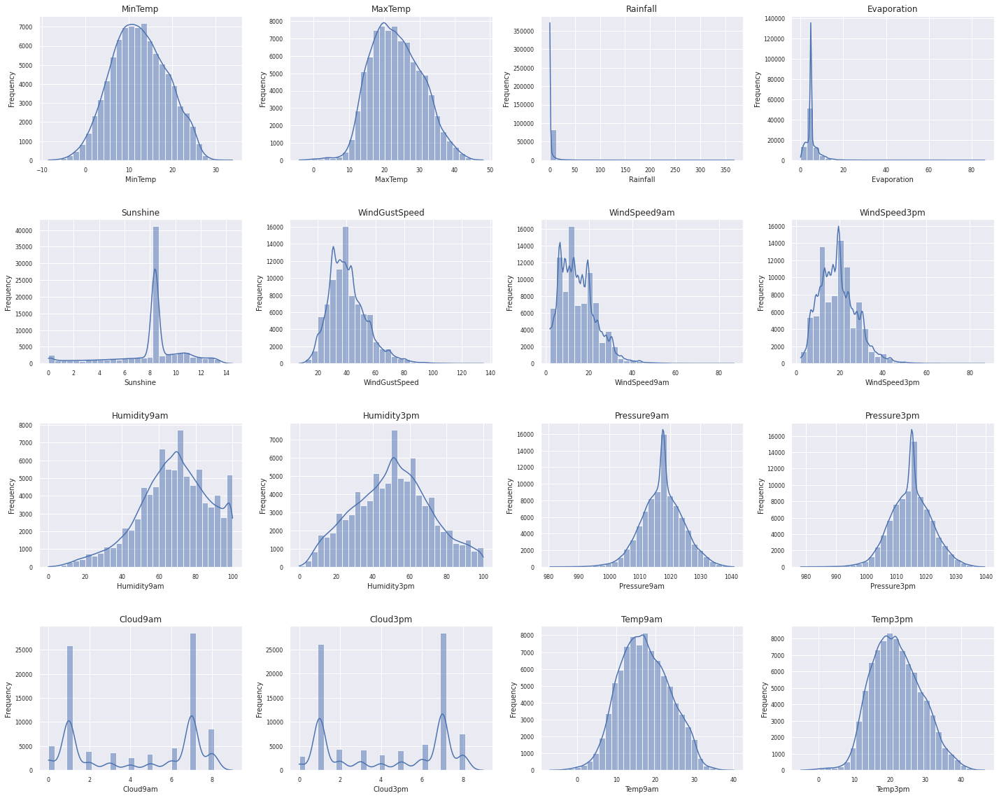

In [0]:
from matplotlib import pyplot as plt
import seaborn as sns
# initialize seaborn
sns.set(style="darkgrid")

numerical_vis = numerical_cols.toPandas() # transform numerical segment for visualization

# Set up subplots
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(20, 16))

# Flatten the axes for easier iteration
axes = axes.flatten()

# Draw histograms of all columns
for i, col in enumerate(numerical_colname):
    sns.histplot(numerical_vis[col], 
                 bins=30, 
                 kde=True, 
                 ax=axes[i]
                 )
    axes[i].set_title(f'{col}', fontsize=12)
    axes[i].set_xlabel(col, fontsize=10)
    axes[i].set_ylabel('Frequency', fontsize=10)
    axes[i].tick_params(axis='both', labelsize=8)

# Adjust layout
plt.tight_layout(h_pad=3)

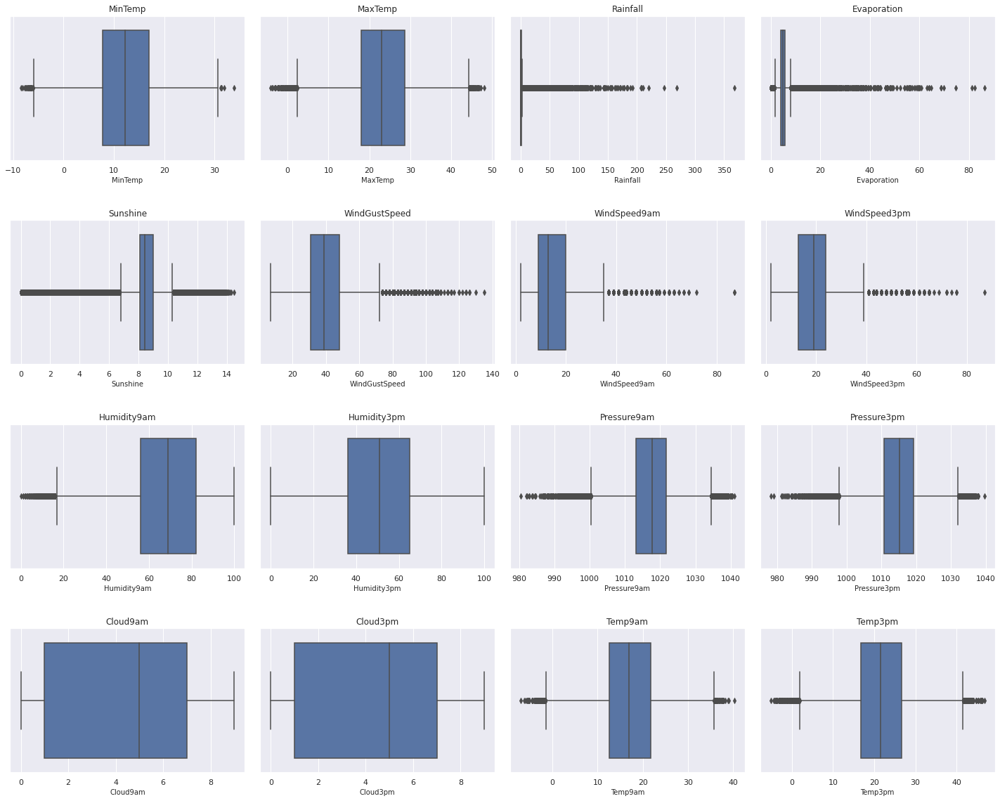

In [0]:
import warnings
warnings.filterwarnings('ignore')

# Set up subplots
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(20, 16))

# Flatten the axes for easier iteration
axes = axes.flatten()

# Draw histograms of all columns
for i, col in enumerate(numerical_colname):
    sns.boxplot(numerical_vis[col], 
                ax=axes[i], 
                # palette='viridis'
                )
    axes[i].set_title(f'{col}', fontsize=12)
    axes[i].set_xlabel(col, fontsize=10)

# Adjust layout
plt.tight_layout(h_pad=3)

According to the distribution plots, we categorized and selected the following outlier filtering strategies.

<table>
  <tr>
    <th scope="col">Strategy</th>
    <th scope="col">Description</th>
    <th scope="col">Scope of Application</th>
    <th scope="col">Corresponding Columns</th>
  </tr>
  <tr>
    <td>Z-Score Masking</td>
    <td>Use Z-Score Masking for symmetric or symmetric-alike data to identify and filter outliers based on their distance from the mean, preserving the normal distribution shape.</td>
    <td>Symmetric or symmetric-alike data</td>
    <td>['MinTemp', 'MaxTemp', 'WindGustSpeed', 'WindSpeed3pm', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm']</td>
  </tr>
  <tr>
    <td>IQR Filtering</td>
    <td>Employ IQR Filtering for skewed data, relying on the robust interquartile range to identify and filter outliers, particularly effective in distributions with long tails.</td>
    <td>Skewed distributed data</td>
    <td>['WindSpeed9am', 'Humidity9am']</td>
  </tr>
  <tr>
    <td>Leave Data as Original</td>
    <td>Leave bimodal data and extremely skewed columns as original to maintain the integrity of the dual modes and avoid potential oversimplification in outlier filtering, allowing for nuanced analysis if needed.</td>
    <td>Bimodal data</td>
    <td>['Rainfall', 'Evaporation', 'Sunshine', 'Cloud9am', 'Cloud3pm']</td>
  </tr>
</table>

### 2.3.1 IQR filtering
The IQR (Interquartile Range) filtering is applied to a Spark DataFrame to remove outliers from selected columns. This process helps enhance data quality by eliminating values that deviate significantly from the dataset's central tendency. Its procedure goes like:
1. **Calculate Quantiles:** Quantiles (Q1 and Q3) are computed for each specified column.
2. **Calculate IQR:** The Interquartile Range (IQR) is determined for each column.
3. **Calculate Bounds:** Lower and upper bounds are defined based on the calculated IQR.
4. **Filter DataFrame:** Values outside the determined bounds are removed from the DataFrame.

In [0]:
# List of columns to apply IQR filtering
skewed_colnames = ['WindSpeed9am', 'Humidity9am']
skewed_cols = df.select(skewed_colnames)

# Calculate Q1 and Q3 for each column
quantiles = {
    c + "_Q1": df.approxQuantile(c, [0.25], 0)[0] for c in skewed_colnames
}
quantiles.update({
    c + "_Q3": df.approxQuantile(c, [0.75], 0)[0] for c in skewed_colnames
})

# Calculate IQR for each column
iqr_values = {
    c + "_IQR": quantiles[c + "_Q3"] - quantiles[c + "_Q1"] for c in skewed_colnames
}

# Calculate lower and upper bounds for filtering
lower_bounds = {
    c + "_lower": quantiles[c + "_Q1"] - 1.5 * iqr_values[c + "_IQR"] for c in skewed_colnames
}
upper_bounds = {
    c + "_upper": quantiles[c + "_Q3"] + 1.5 * iqr_values[c + "_IQR"] for c in skewed_colnames
}

In [0]:
# check IQR calculation
print(quantiles)
print(iqr_values)
print(lower_bounds)
print(upper_bounds)

{'WindSpeed9am_Q1': 9.0, 'Humidity9am_Q1': 56.0, 'WindSpeed9am_Q3': 20.0, 'Humidity9am_Q3': 82.0}
{'WindSpeed9am_IQR': 11.0, 'Humidity9am_IQR': 26.0}
{'WindSpeed9am_lower': -7.5, 'Humidity9am_lower': 17.0}
{'WindSpeed9am_upper': 36.5, 'Humidity9am_upper': 121.0}


In [0]:
# Create a temporary variable to store the filtered DataFrame
filtered_df = df

# Apply IQR filtering to each column
for col_name in skewed_colnames:
    # Filter values below Q1-1.5*IQR and above Q3+1.5*IQR
    filtered_df = filtered_df.filter(
        (filtered_df[col_name] >= lower_bounds[col_name + "_lower"]) &
        (filtered_df[col_name] <= upper_bounds[col_name + "_upper"])
    )

print(str(filtered_df.count()) + " instances remained!")
(filtered_df.limit(10))

84393 instances remained!
Out[303]: DataFrame[row ID: string, Location: string, MinTemp: double, MaxTemp: double, Rainfall: double, Evaporation: double, Sunshine: double, WindGustDir: string, WindGustSpeed: int, WindDir9am: string, WindDir3pm: string, WindSpeed9am: double, WindSpeed3pm: int, Humidity9am: double, Humidity3pm: int, Pressure9am: double, Pressure3pm: double, Cloud9am: int, Cloud3pm: int, Temp9am: double, Temp3pm: double, RainToday: boolean, RainTomorrow: boolean]

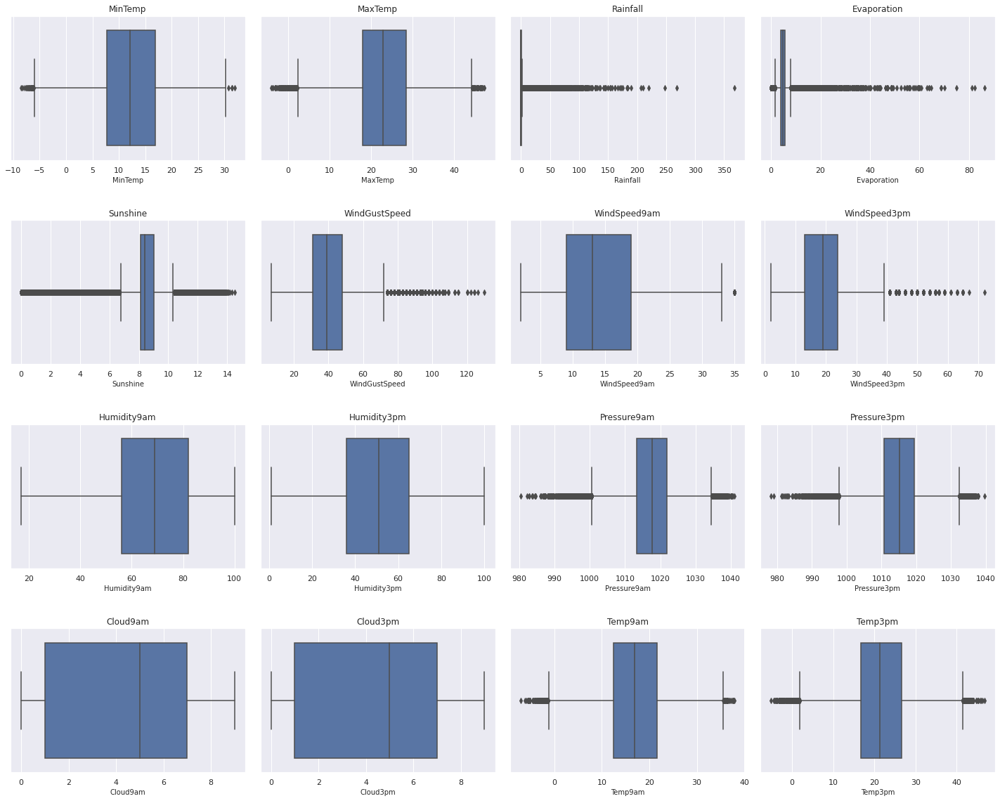

In [0]:
# visualization results
tmp_vis = filtered_df.select(numerical_colname).toPandas()

# Set up subplots
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(20, 16))

# Flatten the axes for easier iteration
axes = axes.flatten()

# Draw histograms of all columns
for i, col in enumerate(numerical_colname):
    sns.boxplot(tmp_vis[col], 
                ax=axes[i], 
                # palette='viridis'
                )
    axes[i].set_title(f'{col}', fontsize=12)
    axes[i].set_xlabel(col, fontsize=10)

# Adjust layout
plt.tight_layout(h_pad=3)

In [0]:
# store the results
df = filtered_df

### 2.3.2 Z-Score Masking
For symmetrically distributed columns, we select `zscore` as the outlier evaluation metric. It is calculated by:

$Z_{score} = \frac{X-\mu}{\sigma}$

*where*

$X$ refers to the data point (instance) we want to calculate zscore for; <br>
$\mu$ refers to the mean value of this column; <br>
$\sigma$ refers to the standard deviation of this column.

In this scenario, we found some columns have very large amount of "outliers". To prevent unnecessary data loss, they are not involved in zscore calculation.

To prevent unexpected data loss, we selected the following threshold: 1.96, which includes approximately 95% of the data points (roughly 2.5% in the tails on both sides).

In [0]:
from pyspark.sql.window import Window

def analyze_z_scores(df, symmetric_colname):
    # Initialize an empty dataframe to store Z-Scores
    zscores_cols = []

    for col in symmetric_colname:
        # Calculate Z-Score
        mean_col = F.mean(df[col]).over(Window.rowsBetween(Window.unboundedPreceding, Window.unboundedFollowing))
        stddev_col = F.stddev(df[col]).over(Window.rowsBetween(Window.unboundedPreceding, Window.unboundedFollowing))
        zscore_col = F.abs((df[col] - mean_col) / stddev_col)
        zscores_cols.append(zscore_col.alias(col + '_zscore'))

    # Create a new DataFrame with Z-Scores
    zscores = df.select('row ID', *zscores_cols)

    return zscores

# Call the function
zscores = analyze_z_scores(df, symmetric_colname)
display(zscores.limit(10))

row ID,MinTemp_zscore,MaxTemp_zscore,WindGustSpeed_zscore,WindSpeed3pm_zscore,Humidity3pm_zscore,Pressure9am_zscore,Pressure3pm_zscore,Temp9am_zscore,Temp3pm_zscore
Row0,0.16711512444355875,0.06539636111929793,0.300904687431871,0.6158342781968159,1.4243449690262344,1.4619624049775688,1.2040247877475017,0.038125208473215356,0.001103027049455921
Row1,0.7773850235557571,0.24452506158509227,0.300904687431871,0.3739826442874711,1.277745890737411,1.031740305711943,1.0994051156775346,0.008729575630938026,0.3638164612134905
Row2,0.8125235589097578,1.2588133540721855,0.06733063087908382,0.13213101037812616,0.8868150153005487,1.0020698161074268,1.3684271295717552,0.10243914383924478,1.1472774790078049
Row3,0.35601515404342177,0.8925425817851798,1.2352009136430195,0.6158342781968159,1.3754786095966265,1.2394337329436225,1.4581011342031678,0.5397504621446754,1.0312091800753138
Row4,0.7301600161557913,0.46992245991555726,0.3998174822264905,0.2306464404858912,1.5709440473150578,0.6163534512485835,0.7556547645904561,0.13183477668152158,0.537918909612227
Row5,0.11989011704359284,0.9488919313677964,0.9448236141829939,0.9562013422139258,1.1800131718781954,1.5658091185934169,1.413264131887453,0.46165915530442,0.9296494185093842
Row6,0.16711512444355875,0.9911539435547582,0.7891075764811357,1.5608304269872881,1.4243449690262344,0.853717368084796,0.9648941087304074,0.5085139394085728,1.0167006427087526
Row7,0.560656852776607,0.23444440986714682,0.7112495576302067,0.714349708304581,1.9474338316167026,1.0465755505142094,1.637449143465976,0.19430782215372597,0.6953067665454905
Row8,0.04118177137698319,0.3330557716367253,0.300904687431871,0.13213101037812616,0.398151421004471,2.4262533171246687,1.996145161991626,0.20992608352177702,0.28906772028177175
Row10,0.27730680837681215,0.34714310903237955,1.4119717272885681,1.1980529761232708,1.5076365967502325,0.7943763888757303,0.7108177622747583,0.008729575630938026,0.5357128555133152


In [0]:
from functools import reduce
# assign shared indexes to df and zscores
df = df.withColumn('row ID', F.monotonically_increasing_id())
zscores = zscores.withColumn('row ID', F.monotonically_increasing_id())

# Specify the threshold for Z-Scores masking
zscore_threshold = 1.96

# Create a condition for any Z-Score over the threshold
condition = reduce(lambda x, y: x | y, (F.col(zscore) > zscore_threshold for zscore in [col + '_zscore' for col in symmetric_colname]))

# Apply the mask to filter out rows with high Z-Scores from zscores
filtered_zscores = zscores.filter(~condition)
print("Instance no. in filtered zscores: " + str(filtered_zscores.count()))

# Extract 'row ID' values from the filtered z-scores
filtered_row_ids = filtered_zscores.select('row ID')

# Use the filtered 'row ID' values to select corresponding rows from the original DataFrame 'df'
filtered_df = df.join(filtered_row_ids, 'row ID', 'right')

# Drop duplicate columns (original columns in df that also exist in zscores)
columns_to_drop = [col + '_zscore' for col in symmetric_colname]
filtered_df = filtered_df.drop(*columns_to_drop)

# verify filtering results
print(str(filtered_df.count()) + " rows remained in filtered DataFrame!")

Instance no. in filtered zscores: 65694
65694 rows remained in filtered DataFrame!


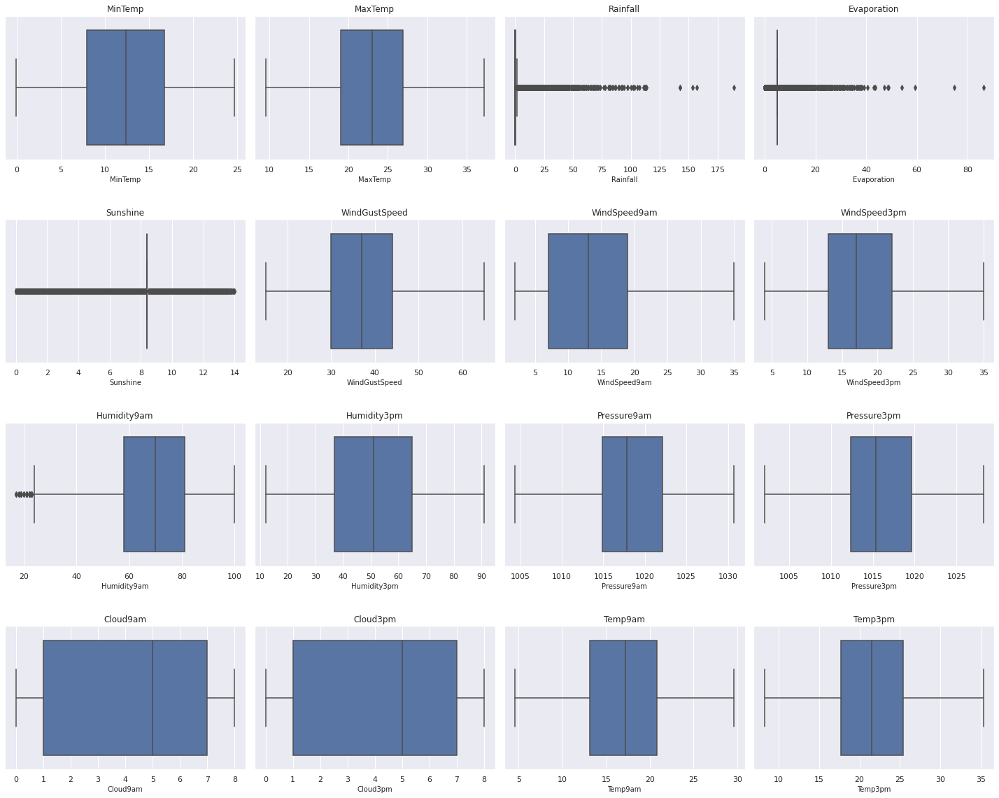

In [0]:
# visualization results
tmp_vis = filtered_df.select(numerical_colname).toPandas()

# Set up subplots
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(20, 16))

# Flatten the axes for easier iteration
axes = axes.flatten()

# Draw histograms of all columns
for i, col in enumerate(numerical_colname):
    sns.boxplot(tmp_vis[col], 
                ax=axes[i], 
                # palette='viridis'
                )
    axes[i].set_title(f'{col}', fontsize=12)
    axes[i].set_xlabel(col, fontsize=10)

# Adjust layout
plt.tight_layout(h_pad=3)

In [0]:
# save results
df = filtered_df

# 3 Final Visualization for Data Readiness Checking
After completing the essential preprocessing steps mentioned earlier, we incorporated visualization techniques to assess the preparedness of the data for the assumed model training in the future. Specifically, for numerical data, we generated histograms once again to visualize their distributions. In the case of categorical data, we utilized pie charts to gain insights into the distribution patterns.

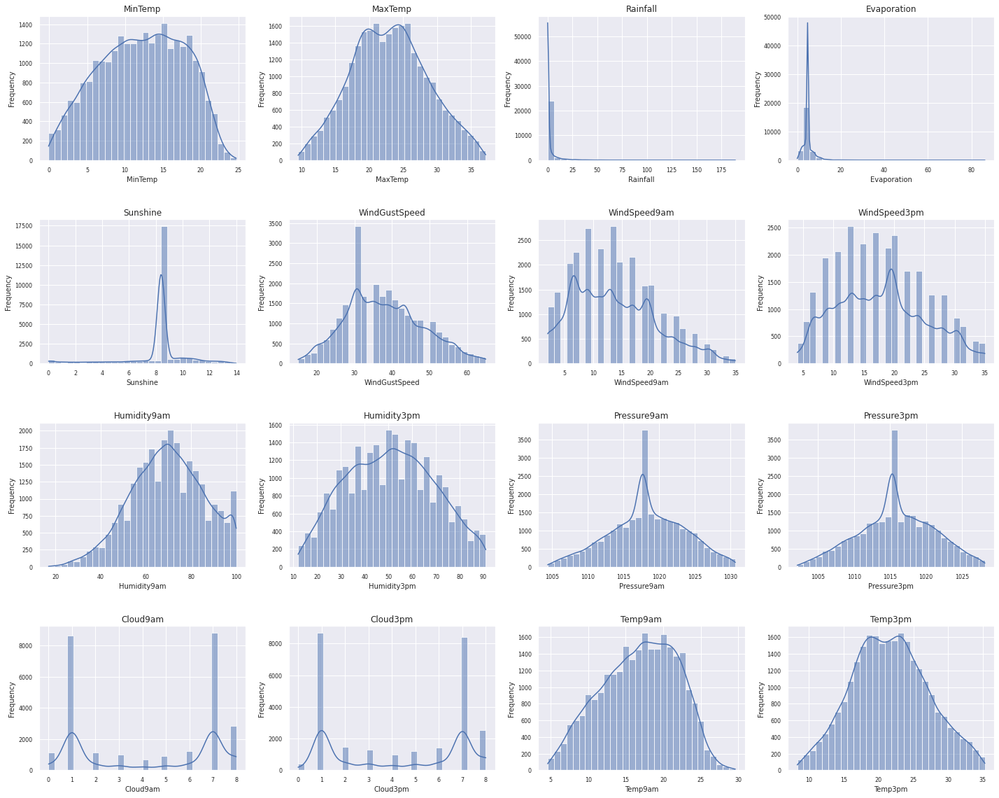

In [0]:
# numerical column visualization
# select final numerical data columns
numerical_cols = df.select(numerical_colname)
numerical_vis = numerical_cols.toPandas() # transform numerical segment for visualization

# Set up subplots
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(20, 16))

# Flatten the axes for easier iteration
axes = axes.flatten()

# Draw histograms of all columns
for i, col in enumerate(numerical_colname):
    sns.histplot(numerical_vis[col], 
                 bins=30, 
                 kde=True, 
                 ax=axes[i]
                 )
    axes[i].set_title(f'{col}', fontsize=12)
    axes[i].set_xlabel(col, fontsize=10)
    axes[i].set_ylabel('Frequency', fontsize=10)
    axes[i].tick_params(axis='both', labelsize=8)

# Adjust layout
plt.tight_layout(h_pad=3)

In [0]:
# select categorical columns
categorical_colname = [col_name for col_name, col_type in df.dtypes if 'string' in col_type.lower() or 'boolean' in col_type.lower()]
print("Categorical Columns: ", categorical_colname)

Categorical Columns:  ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']


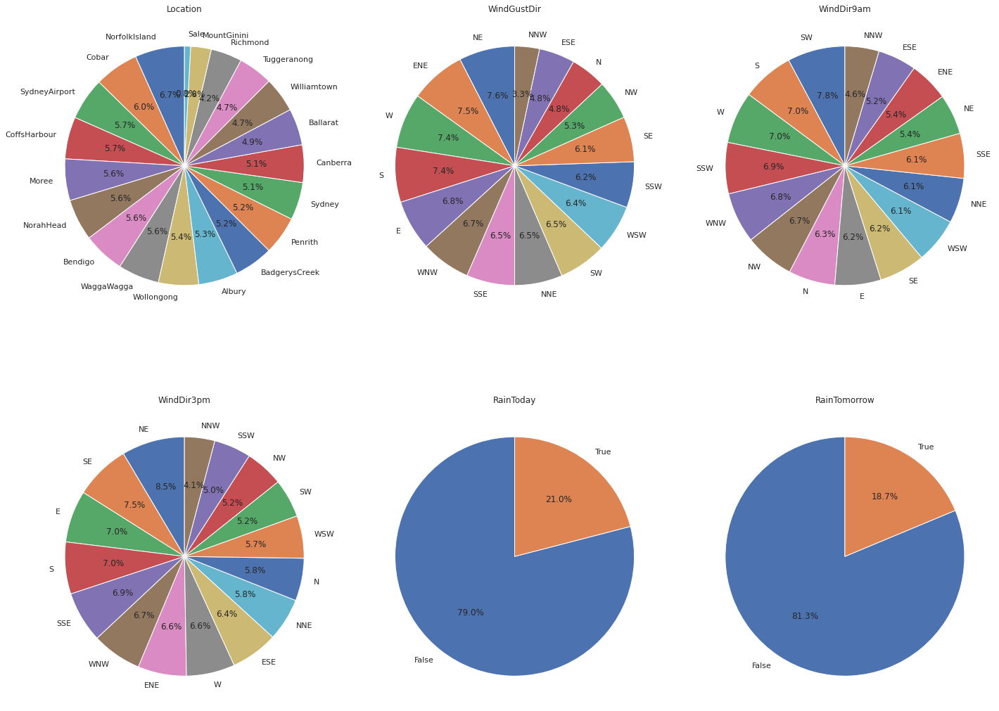

In [0]:
# select final categorical data columns
categorical_cols = df.select(categorical_colname)
categorical_vis = categorical_cols.toPandas() # transform numerical segment for visualization

# Set up subplots
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(20, 16))

# Flatten the axes for easier iteration
axes = axes.flatten()

# Iterate through categorical columns and create pie charts
for i, (col_name, col_data) in enumerate(categorical_vis.iteritems()):
    # Calculate value counts for each category
    counts = col_data.value_counts()
    
    # Create a pie chart
    ax = axes[i]
    ax.pie(counts,
           labels=counts.index,
           autopct='%1.1f%%',
           startangle=90)
    ax.set_title(col_name)

# Adjust layout
plt.tight_layout(h_pad=3)